**Enable GPU** (Runtime > Change runtime type > GPU

In [1]:
!nvidia-smi

Wed Sep 14 18:06:15 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Clone MddGAN repo

In [2]:
import os

os.chdir('/content')
CODE_DIR = 'mddgan'
!git clone https://9c58f255e81847185f11d4074e7f97e05699da27@github.com/lazavgeridis/mddgan.git $CODE_DIR
os.chdir(f'./{CODE_DIR}')

Cloning into 'mddgan'...
remote: Enumerating objects: 364, done.
remote: Counting objects: 100% (364/364), done.
remote: Compressing objects: 100% (288/288), done.
remote: Total 364 (delta 152), reused 286 (delta 74), pack-reused 0
Receiving objects: 100% (364/364), 4.80 MiB | 19.68 MiB/s, done.
Resolving deltas: 100% (152/152), done.


In [3]:
!pip install tensorly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 198 kB 30.6 MB/s 
     |████████████████████████████████| 154 kB 53.4 MB/s 


Select GAN model, competing method (interFaceGAN or SeFa) and attribute comparison (age, eyeglasses, gender, pose and smile)

In [24]:
#@title { display-mode: "form", run: "auto" }
gan_model_name = "stylegan_ffhq1024" #@param ['stylegan_ffhq1024', 'stylegan_celebahq1024']
competing_method_name = "sefa" #@param ['interfacegan', 'sefa']
attribute_name = 'gender' #@param ['age', 'eyeglasses', 'gender', 'pose', 'smile']

Load selected GAN model

In [25]:
from models import parse_gan_type
from utils  import load_generator, parse_indices

generator = load_generator(gan_model_name).cuda()
gan_type  = parse_gan_type(generator)

Building generator for model `stylegan_ffhq1024` ...
Finish building generator.
Loading checkpoint from `checkpoints/stylegan_ffhq1024.pth` ...
Finish loading checkpoint.


Set random seed and sample latent codes

In [26]:
import torch
import numpy as np

# set random seed
seed = 4
np.random.seed(seed)
torch.manual_seed(seed)

# prepare interpolation magnitudes
start = -5.0  #-2.0, -3.0, -5.0
end = 5.0     # 2.0, 3.0, 5.0
step = 5
magnitudes = np.linspace(start, end, step)

Visualize comparison grid

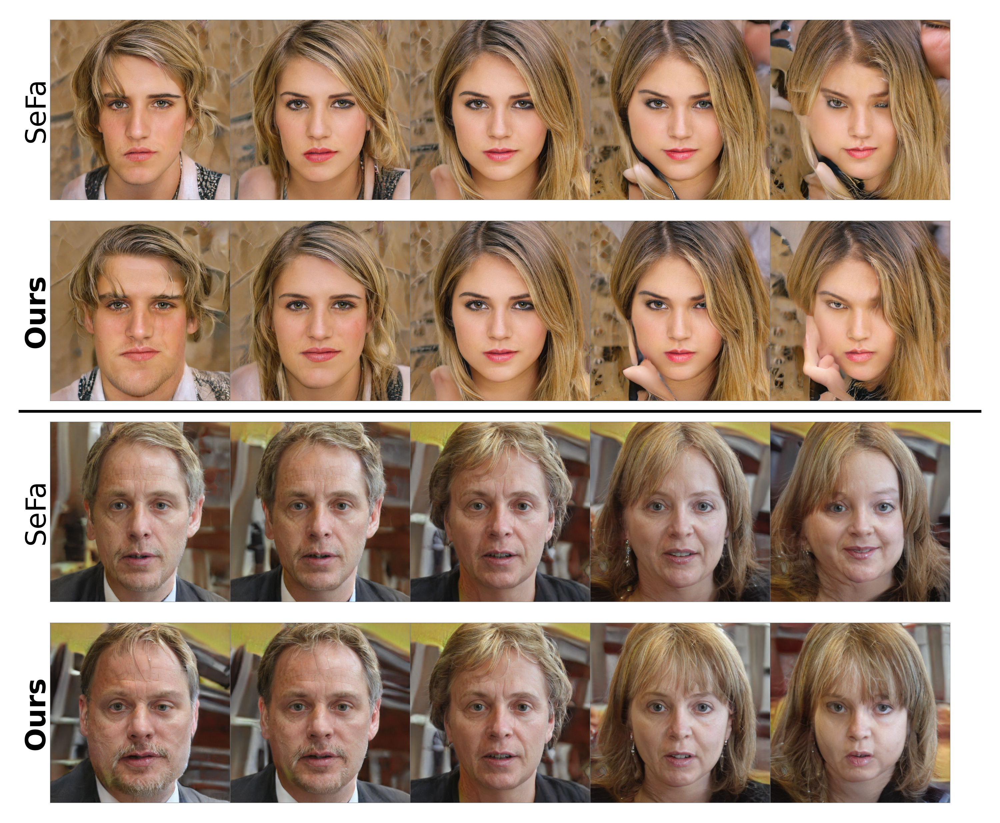

In [27]:
from visualization import create_comparison_chart
from directions import ATTRIBUTES

SEMANTICS_DIR = 'semantics'

#ATTRIBUTES_FFHQ = {'pose' : '0-6', 'pose_inverted' : '0-3', 'gender' : '2-4',
#                   'gender_alt' : '2-3',
#                   'age' : '2,4,5,6', 'smile' : '3', 'smile_alt' : '2-5', 
#                   'eyeglasses' : '0-2', 'eyeglasses_alt' : '0-17'}
#
#ATTRIBUTES_CELEBAHQ = {'pose' : '0-3', 'gender' : '0-1', 'age' : '5-7',
#                       'smile' : '2-3', 'eyeglasses' : '0-1', 'eyeglasses_alt' : '0-5'}

# load semantic attribute for each each method
if gan_model_name == 'stylegan_ffhq1024' and competing_method_name == 'sefa' and attribute_name == 'pose':
  attribute_name = 'pose_inverted'
competing_attr_vector = np.load(f'{SEMANTICS_DIR}/{competing_method_name}/{gan_model_name}_{attribute_name}.npy')
competing_attr_vector = torch.from_numpy(competing_attr_vector).cuda()
mddgan_attr_vector = np.load(f'{SEMANTICS_DIR}/mddgan/{gan_model_name}_{attribute_name}.npy')
mddgan_attr_vector = torch.from_numpy(mddgan_attr_vector).cuda()

# retrieve layers to apply the edit
model_attributes = ATTRIBUTES[gan_model_name]
layer_range, _ = model_attributes[attribute_name]
mddgan_layers = parse_indices(layer_range, min_val=0, max_val=generator.num_layers - 1)

reverse = False
cond1 = (gan_model_name == 'stylegan_celebahq1024' and attribute_name in ['gender', 'age', 'eyeglasses'])
cond2 = (gan_model_name == 'stylegan_ffhq1024' and competing_method_name == 'interfacegan' and attribute_name in ['age', 'eyeglasses', 'gender', 'smile'])
cond3 = (gan_model_name == 'stylegan_ffhq1024' and competing_method_name == 'sefa' and attribute_name in ['age', 'eyeglasses', 'smile'])
if cond1 or cond2 or cond3:
  reverse = True
text = ['Ours']
if competing_method_name == 'interfacegan':
  competing_layers = list(range(generator.num_layers))
  text.insert(0, 'InterFaceGAN')
elif competing_method_name == 'sefa':
  competing_layers = mddgan_layers
  text.insert(0, 'SeFa')

#reverse = False
#if competing_method == 'interfacegan':
#  cond1 = (model_name == 'stylegan_celebahq1024' and mddgan_attr in ['gender', 'age', 'eyeglasses_alt'])
#  cond2 = (model_name == 'stylegan_ffhq1024' and mddgan_attr in ['gender', 'smile', 'age', 'eyeglasses'])
#  if cond1 or cond2:
#    reverse = True
#elif competing_method == 'sefa':
#  cond1 = (model_name == 'stylegan_ffhq1024' and mddgan_attr in ['age', 'smile', 'smile_alt', 'eyeglasses'])
#  cond2 = (model_name == 'stylegan_celebahq1024' and mddgan_attr in ['gender', 'age', 'eyeglasses'])
#  if cond1 or cond2:
#    reverse = True

trunc_psi = 0.7
trunc_layers = 8
create_comparison_chart(generator,
                        gan_type,
                        trunc_psi,
                        trunc_layers,
                        [competing_layers, mddgan_layers],
                        [competing_attr_vector, mddgan_attr_vector],
                        magnitudes,
                        text,
                        reverse=reverse)